<a href="https://colab.research.google.com/github/barauna-lo/Cross_Correlation/blob/main/Introduction_to_Healpy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src=https://raw.githubusercontent.com/barauna-lo/CAP4213-Deep-Learning/main/logoinpe.png>

# BINGO Stage III
These notebook is a personal self learnig from Camila Novaes healpy couse. You can fing the complet couse on her github page [cpnoaves](https://github.com/cpnovaes/Healpy-Classes)

for: Luan Orion Baraúna

[https://github.com/barauna-lo](https://github.com/barauna-lo)

# Aula 03

Instal healpy in google cloud

In [2]:
! pip install -q 'healpy==1.13.0' 'astropy==4.0'

     |████████████████████████████████| 11.8 MB 5.3 MB/s 
     |████████████████████████████████| 6.5 MB 28.9 MB/s 


Importing the Librarys

In [3]:
import healpy as hp
import matplotlib
import numpy as np
from matplotlib import pyplot

Uploading the Maps from the git-hub page

In [1]:
#Importin the image file
COM_CMB_IQU = 'COM_CMB_IQU-commander_0256_R2.00.fits'

!wget https://github.com/barauna-lo/Cross_Correlation/{COM_CMB_IQU}
!wget https://irsa.ipac.caltech.edu/data/Planck/release_2/all-sky-maps/maps/HFI_SkyMap_100_2048_R2.02_full.fits

--2021-11-05 15:07:31--  https://github.com/barauna-lo/Cross_Correlation/COM_CMB_IQU-commander_0256_R2.00.fits
Resolving github.com (github.com)... 140.82.113.3
Connecting to github.com (github.com)|140.82.113.3|:443... connected.
HTTP request sent, awaiting response... 404 Not Found
2021-11-05 15:07:31 ERROR 404: Not Found.

--2021-11-05 15:07:31--  https://irsa.ipac.caltech.edu/data/Planck/release_2/all-sky-maps/maps/HFI_SkyMap_100_2048_R2.02_full.fits
Resolving irsa.ipac.caltech.edu (irsa.ipac.caltech.edu)... 134.4.54.87
Connecting to irsa.ipac.caltech.edu (irsa.ipac.caltech.edu)|134.4.54.87|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2013278400 (1.9G) [image/x-fits]
Saving to: ‘HFI_SkyMap_100_2048_R2.02_full.fits’

HFI_SkyMap_100_2048 100%[===================>]   1.88G  3.64MB/s    in 1m 52s  

2021-11-05 15:09:23 (17.2 MB/s) - ‘HFI_SkyMap_100_2048_R2.02_full.fits’ saved [2013278400/2013278400]



Reading and alocating the mapa

In [4]:
mapa = hp.read_map("HFI_SkyMap_100_2048_R2.02_full.fits",field={0,1,2},h=False,nest=True)
NSIDE = 192
#ORDERING = NESTED in fits file
#INDCSCHM = IMPLICIT 

/usr/local/lib/python3.7/dist-packages/healpy/fitsfunc.py:352: UserWarning: If you are not specifying the input dtype and using the default np.float64 dtype of read_map(), please consider that it will change in a future version to None as to keep the same dtype of the input file: please explicitly set the dtype if it is important to you.
  "If you are not specifying the input dtype and using the default "


NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT


/usr/local/lib/python3.7/dist-packages/healpy/fitsfunc.py:403: UserWarning: No INDXSCHM keyword in header file : assume IMPLICIT
  warnings.warn("No INDXSCHM keyword in header file : " "assume {}".format(schm))


Showing a exemple map

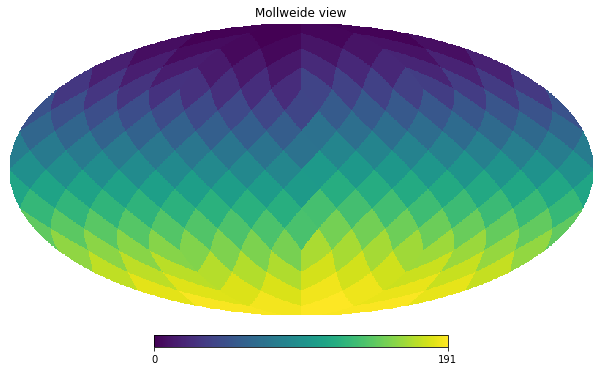

In [6]:
#mapa_ex = mapa EXEMPLO
#mapa_ex = list(range(192)) #apenas uma lista que vai de 1 até 192
mapa_ex = np.array(list(range(192))) #aqui eu ja estou tranformando em um vetor 
#mapa_ex = np.zeros(192) # nesse caso tenho uma lista de zeros que me dá um mapa
hp.mollview(mapa_ex)

Ploting the caled map

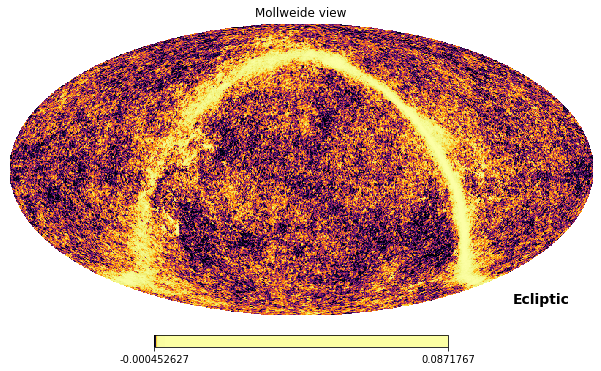

In [14]:
from matplotlib import pyplot
mollview_fig = hp.mollview(mapa[0], nest = True, norm='hist', coord= ['G','E'],cmap="inferno")
pyplot.savefig('mollweide_view.png')

### Exercícios

In [ ]:
#mapa = hp.read_map('/home/barauna/Documentos/Project/LFI_SkyMap_030-BPassCorrected-field-IQU_1024_R3.00_full.fits', field={0,1,2}, h=True, nest=True)
#r = hp.rotator.Rotator(rot=None, coord=None, inv=None, deg=True, eulertype='ZYX')
#r = Rotator(coord=['G','E'])

In [ ]:
len(mapa2[0])

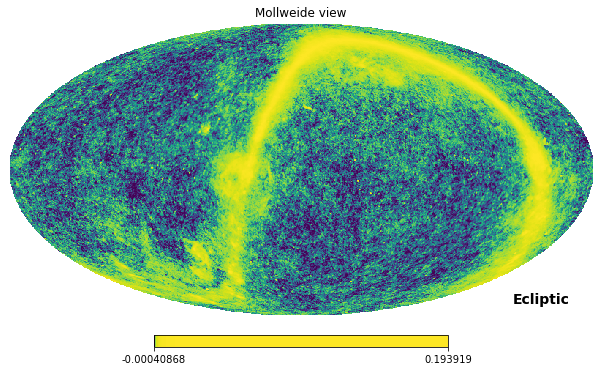

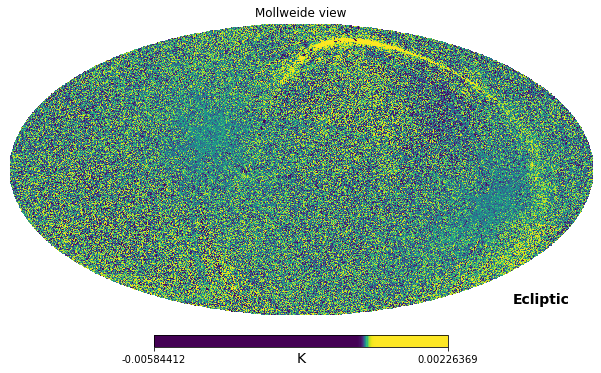

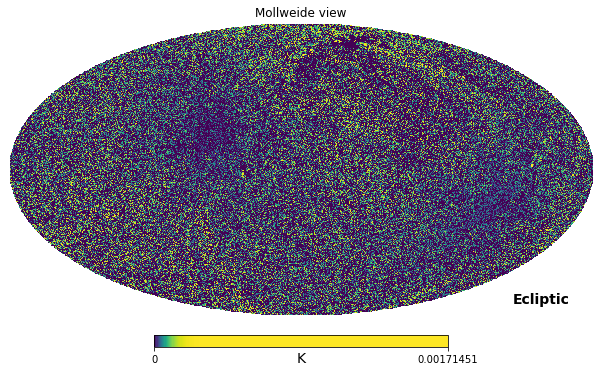

In [ ]:
mollview_fig = hp.mollview(mapa[0][0], nest = True, norm = 'hist', coord =['G','E'],rot=[0,210,70])
mollview_fig = hp.mollview(mapa[0][1], nest = True, norm = 'hist', coord =['G','E'],rot=[0,210,70], unit='K',)
mollview_fig = hp.mollview(mapa[0][2], nest = True, norm = 'hist', coord =['G','E'],rot=[0,210,70], unit='K', min=0)


### Resumo da aula:

Os mapas possuem são matrizes

Utilizanmos o comando hp.read_map('path/file')

head = True informa que o queremos que o header do mapa seja lido

field={0,1,2} = força o que todas as colunas sejam lidas, caso nao seja colocado ele lerá somente a primeira

nest = True e o formato do qual ele foi formatado. Esta mais claro na aula 1 (o ring os pixeis estão linear e o neste estão em circulos)

a comando \textbf{rot} dentro da linha e comando tem o pode der rotacionar o plot

o nside = $\sqrt(\text(len(mapa[0][0]))/12)$



#### Perguntas
Qual é a diferença entre a coluna [0], [1] e [2] do mapa[0]?

Como consigo extraia essa informação do header? 

Como fazer a rotação?

Por que devo fazer a rotação? 


# Aula 04

In [ ]:
import healpy as hp
mapa = hp.read_map('/home/barauna/Documentos/INPE/Project/LFI_CompMap_Foregrounds-smica_1024_R2.00.fits',h=True,field={0,1,2})

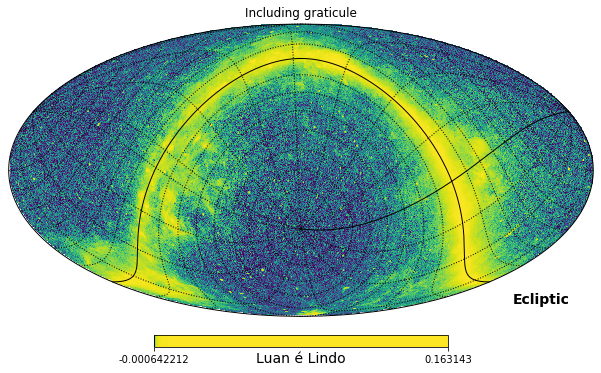

In [ ]:
hp.mollview(mapa[0][0], norm='hist', title='Including graticule', unit='Luan é Lindo', coord=['G','E'])
hp.graticule(dpar=10.,dmer=25.,coord=['G','E'], local=True) #coloca uma grade bonita no mapa


## Exercício

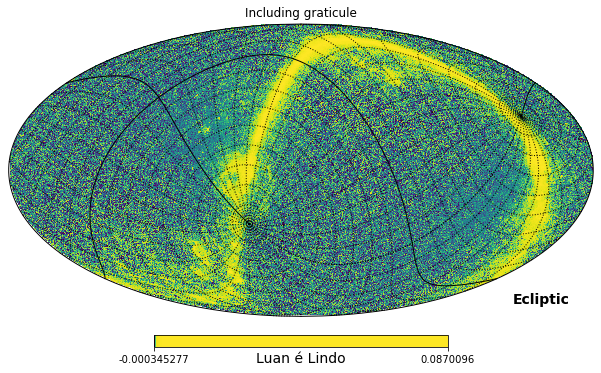

In [ ]:
hp.mollview(mapa[0][2], norm='hist', title='Including graticule', unit='Luan é Lindo', coord=['G','E'],rot=[0,210,70])
hp.graticule(dpar=10.,dmer=12.,coord=['G','E'], local=True,rot=[10,240,30]) #coloca uma grade bonita no mapa


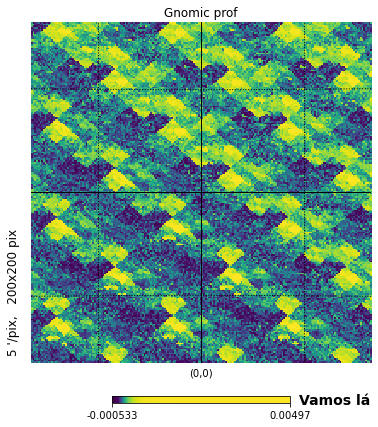

In [ ]:
hp.gnomview(mapa[0][0], title='Gnomic prof', nest = True, norm = 'hist', unit='Vamos lá' ,reso=5)
hp.graticule(dpar=5,local=False)

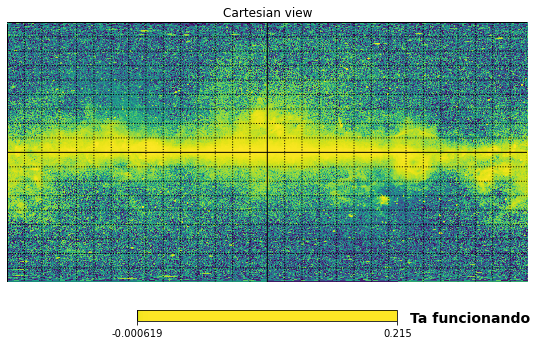

In [ ]:
hp.cartview(mapa[0][0], nest=False, norm='hist', unit='Ta funcionando',rot=[0,0,0])
hp.graticule(dpar=10.,dmer=12.,local=True)

In [ ]:
mapa[1]

[('XTENSION', 'BINTABLE'),
 ('BITPIX', 8),
 ('NAXIS', 2),
 ('NAXIS1', 12),
 ('NAXIS2', 12582912),
 ('PCOUNT', 0),
 ('GCOUNT', 1),
 ('TFIELDS', 3),
 ('COMMENT', ''),
 ('COMMENT', ' *** End of mandatory fields ***'),
 ('COMMENT', ''),
 ('EXTVER', 1),
 ('DATE', '2016-04-18'),
 ('COMMENT', ''),
 ('COMMENT', ' *** Column names ***'),
 ('COMMENT', ''),
 ('TTYPE1', 'C030'),
 ('TTYPE2', 'C044'),
 ('TTYPE3', 'C070'),
 ('COMMENT', ''),
 ('COMMENT', ' *** Column formats ***'),
 ('COMMENT', ''),
 ('TFORM1', 'E'),
 ('TFORM2', 'E'),
 ('TFORM3', 'E'),
 ('COMMENT', ''),
 ('COMMENT', ' *** Column units ***'),
 ('COMMENT', ''),
 ('TUNIT1', 'K_CMB'),
 ('TUNIT2', 'K_CMB'),
 ('TUNIT3', 'K_CMB'),
 ('COMMENT', ''),
 ('COMMENT', ' *** Planck params ***'),
 ('COMMENT', ''),
 ('EXTNAME', 'LFI-RESID'),
 ('AST-COMP', 'FOREGDS'),
 ('PIXTYPE', 'HEALPIX'),
 ('COORDSYS', 'GALACTIC'),
 ('ORDERING', 'NESTED'),
 ('NSIDE', 1024),
 ('FIRSTPIX', 0),
 ('LASTPIX', 12582911),
 ('FILENAME', 'LFI_Foregrounds-smica_1024_R2.00.fi

#### Writing a healpix mapa 

In [ ]:
import numpy as np
np.sqrt(len(mapa[0][0])/12)

1024.0

In [ ]:
mapa[0][0]

array([-0.00038262, -0.0003826 , -0.0003765 , ..., -0.00032156,
       -0.00028325, -0.00043159])

In [ ]:
mapa[0][0][:] = mapa[0][0][:]*1e6

In [ ]:
# Tentando ler um mapa de RFI (mas não ta dando)
RFI = hp.read_map('/home/barauna/Documentos/INPE/RFI/BINGO_20201011_201952_01.fit', h=True, nest=True)
#r = hp.rotator.Rotator(rot=None, coord=None, inv=None, deg=True, eulertype='ZYX')
#r = Rotator(coord=['G','E'])

TypeError: unsupported format string passed to NoneType.__format__

In [ ]:

hp.write_map('new_map2.fits',mapa[0],coord='G',column_names=list(['30GHz','44GHz','70GHz']),column_units=list(['microK','K','K']),fits_IDL=True)


OSError: File 'new_map2.fits' already exists.

In [ ]:
mapa2 = hp.read_map('new_map.fits',field={0,1,2},h=True)

In [ ]:
len(mapa[0])

3

In [ ]:
for i in range(len(mapa2[0])):
    hp.mollview(mapa2[0][i])

NameError: name 'mapa2' is not defined

### Escrevendo arquivos genéricos com o healpy

In [ ]:
data = hp.mrdfits('/home/barauna/Documentos/Project/LFI_CompMap_Foregrounds-smica_1024_R2.00.fits')

AttributeError: module 'healpy' has no attribute 'mrdfits'

Parece que o mdrfits não funciona mais

In [ ]:
from astropy.io import fits

hdulist = fits.open('/home/barauna/Documentos/Project/COM_PCCS_030_R2.04.fits')
hdulist.info()

data = hp.mrdfits(hdlist, hdu = 1)

Filename: /home/barauna/Documentos/Project/COM_PCCS_030_R2.04.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      17   ()      
  1  PCCS2_f030    1 BinTableHDU    130   1560R x 35C   [23A, 1D, 1D, 1D, 1D, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1I, 1I, 24A, 23A, 1I]   


AttributeError: module 'healpy' has no attribute 'mrdfits'

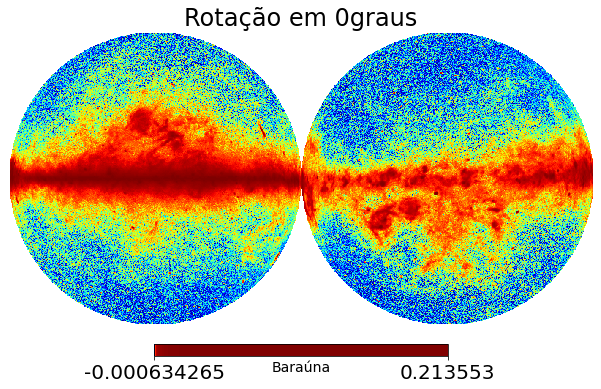

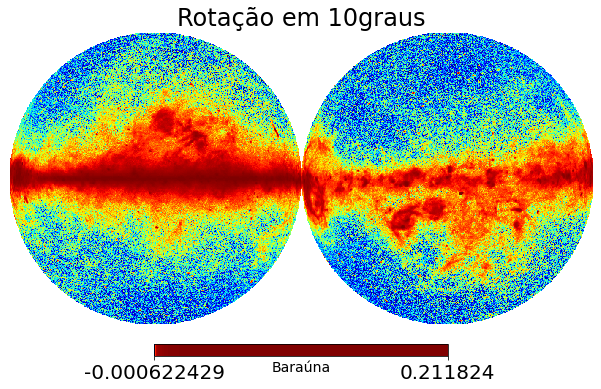

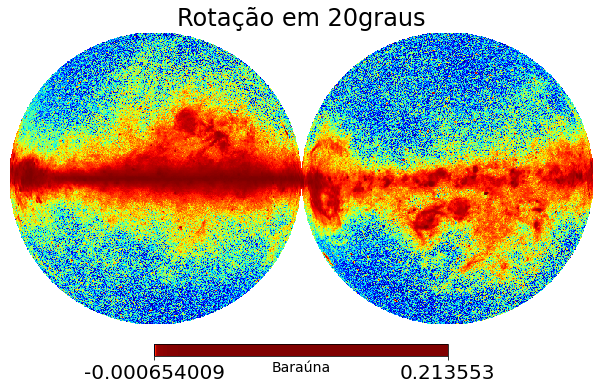

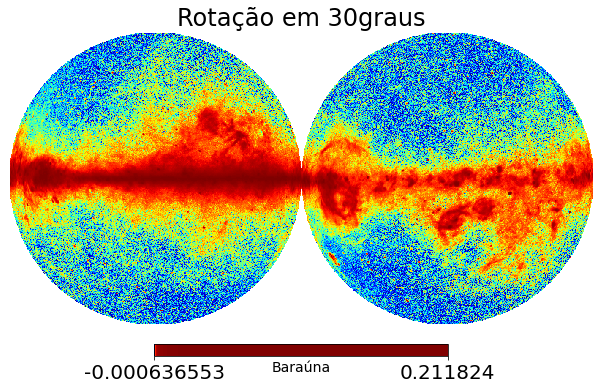

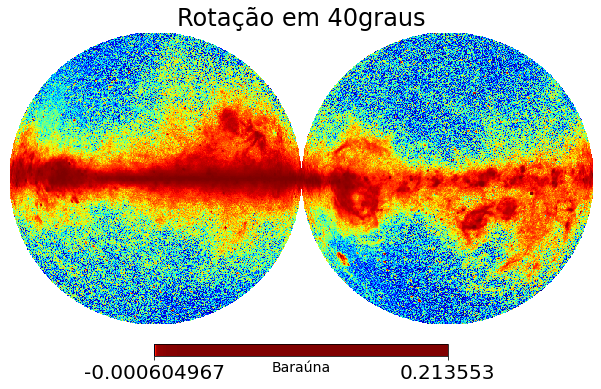

...

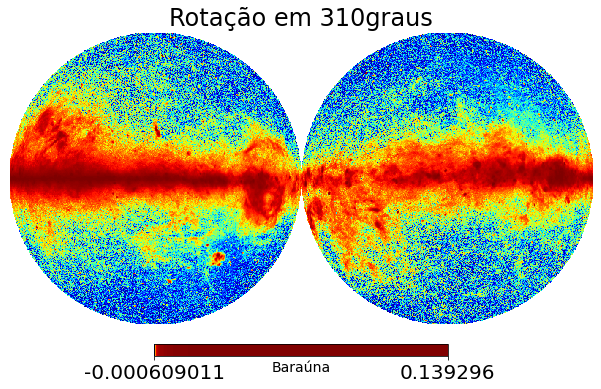

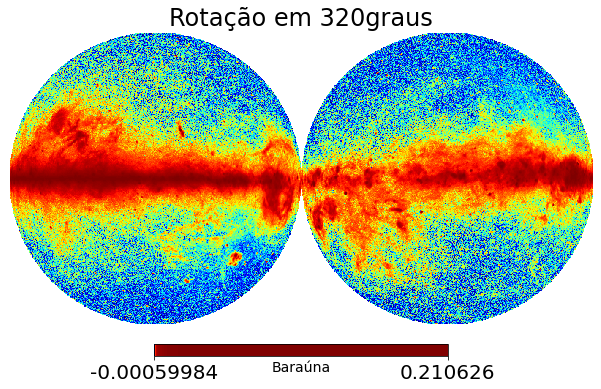

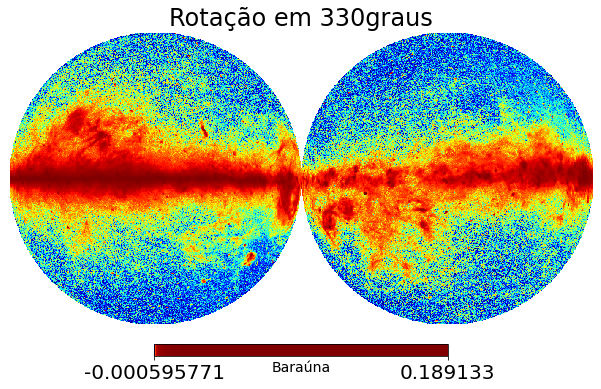

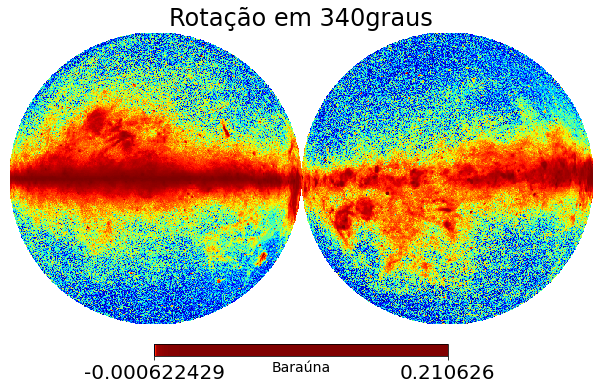

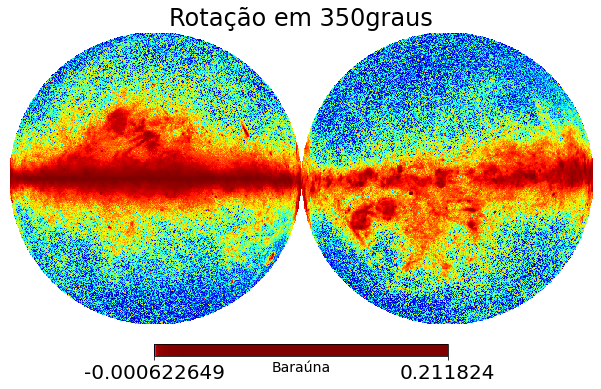

In [ ]:
for i in range (0,360,10):
    hp.orthview(mapa[0][0], nest=False, norm = 'hist', unit='Baraúna',cmap='jet',rot=[i,0,0],title ='Rotação em '+ str(i)+ 'graus')
    pyplot.savefig('rotacao_em'+str(i)+'.png')
    

### Perguntas

O que é esse dmer? (parece ser um intervalo da gradação) ! nº de linhas graticuladas no meridiano

O que é o dpar ! nº de linhas paralelas #top

O que faz o mrdfits?

O que faz o pyfits? 



# Aula 05

### Converstion Between NESTED and RING schemes

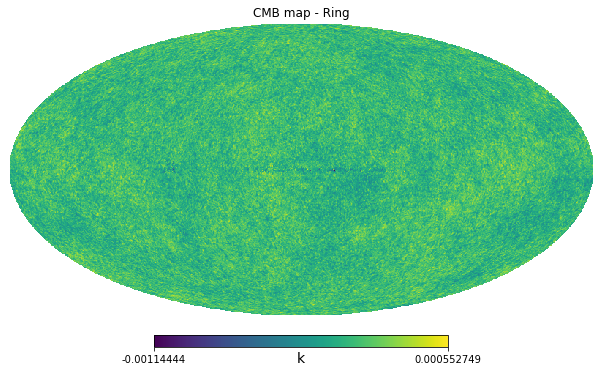

In [ ]:
mapa_ring = hp.read_map('/home/barauna/Documentos/Project/COM_CMB_IQU-smica-field-Int_2048_R2.01_full.fits')
hp.mollview(mapa_ring, title='CMB map - Ring', unit='k')

Conversion between NESTED and RING schemes 

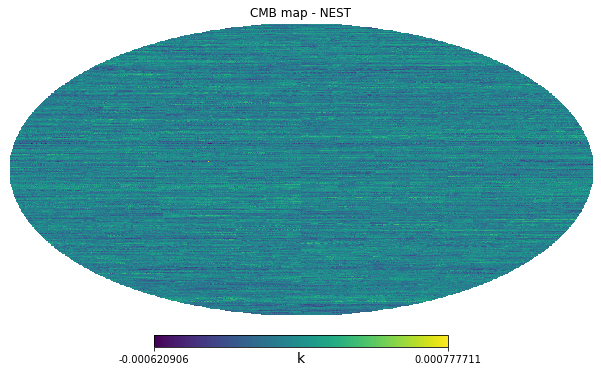

In [ ]:
mapa_nest = hp.reorder(mapa_ring, inp = 'RING', out = 'NEST')
#ouu
mapa_nest = hp.reorder(mapa_ring, r2n=True)
hp.mollview(mapa_nest, title = 'CMB map - NEST', unit ='k')


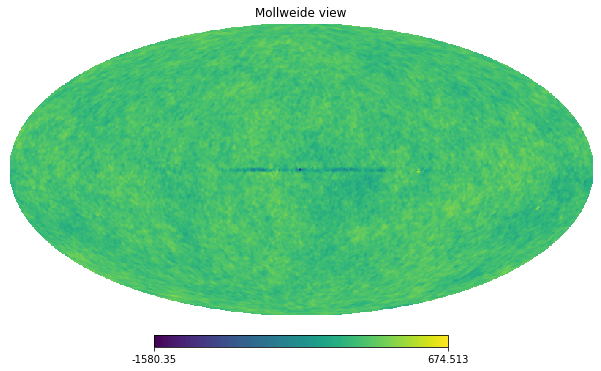

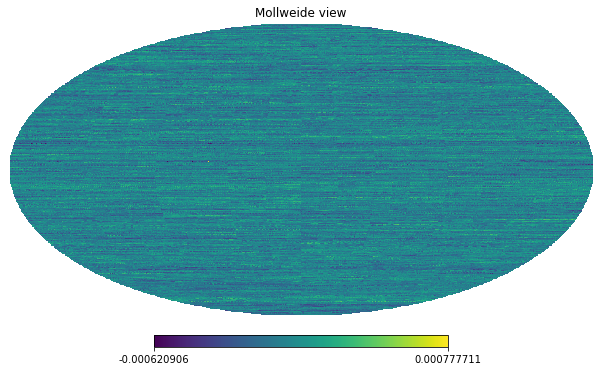

In [ ]:
#Exercice

mapa_exer_ring = hp.read_map('/home/barauna/Documentos/Project/COM_CMB_IQU-commander_0256_R2.00.fits')
hp.mollview(mapa_exer_ring)
mapa_exer_nest = hp.reorder(mapa_ring,r2n=True)
hp.mollview(mapa_exer_nest)
#mapa_nest = hp.reorder(mapa_ring, r2n=True)

In [ ]:
mapa_exer_ring.nside2pix

AttributeError: 'numpy.ndarray' object has no attribute 'nside2pix'

Não entendi essa parte do NSIDE -> resolution

 Equação
 
 $ N_{side} / N_{pix} / $
 
 Resolution

\begin{equation}
    N_{pix} = 12 \cdot N_{side}^2
\end{equation}

In [ ]:
#Nside to Npix

Nside1 = 64
Npix1 = 12*Nside1**2
print('(1)', Nside1, '-->', Npix1)

(1) 64 --> 49152


In [ ]:
Nside = 4
Resolution = hp.nside2resol(Nside)
print('(1)', Nside, '-->', Resolution,'radians')

(1) 4 --> 0.2558316769866221 radians


In [ ]:
Resolution = hp.nside2resol(Nside ,arcmin=True)
print('(2)', Nside, '-->', Resolution,'degrees')

(2) 4 --> 879.4845214252559 degrees


In [ ]:
Area       = hp.nside2pixarea(Nside , degrees=True)
print('(3)', Nside, '-->', Area,'degrees 2')

(3) 4 --> 214.8591731740587 degrees 2


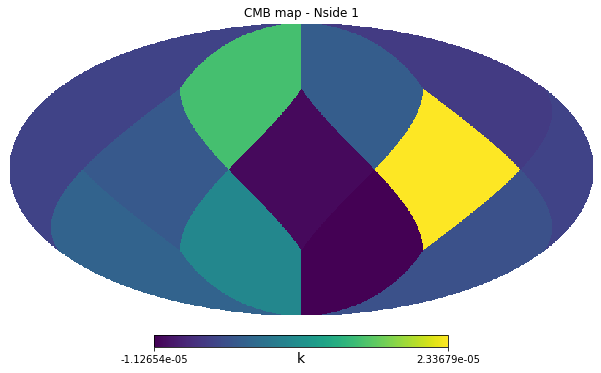

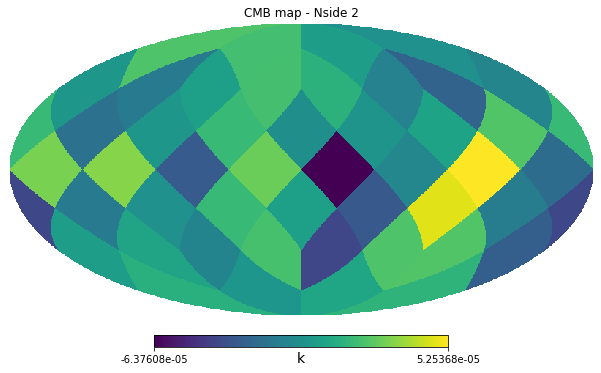

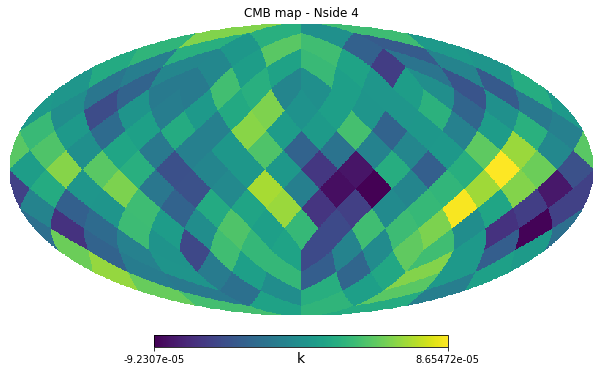

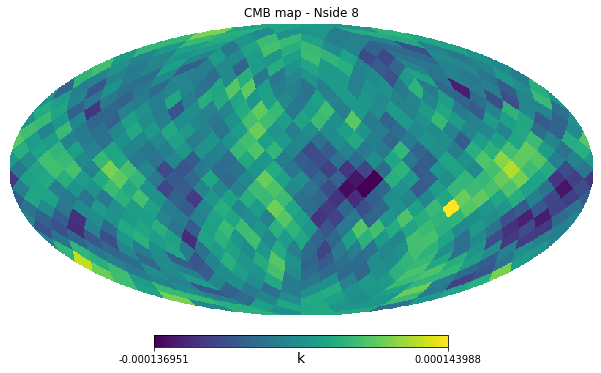

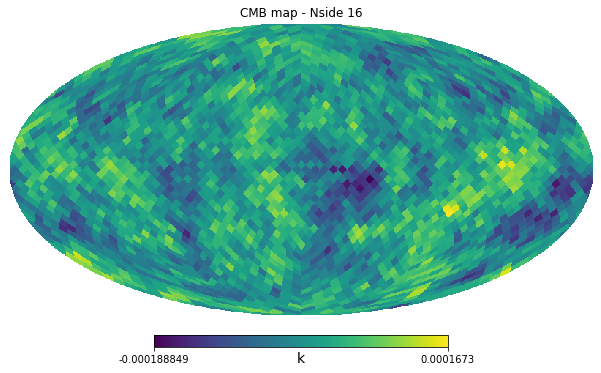

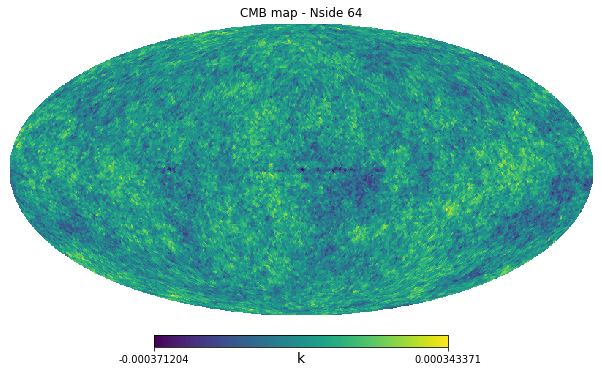

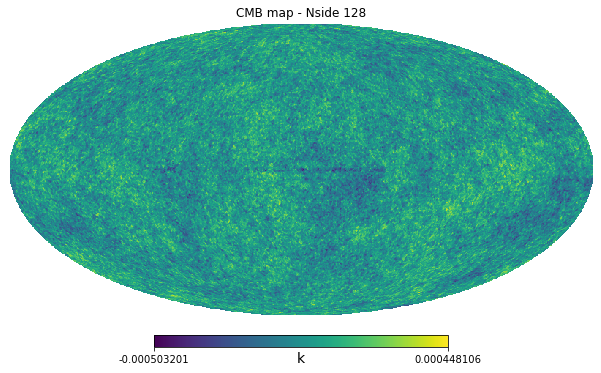

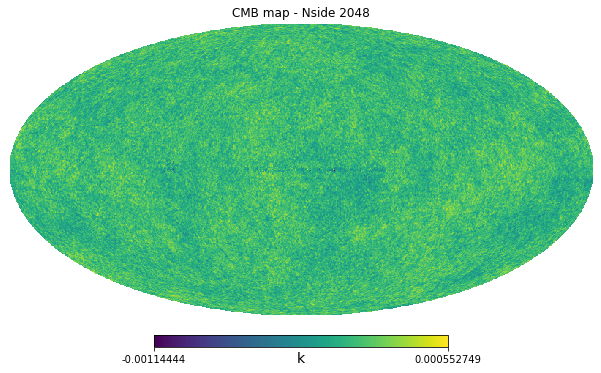

In [ ]:
mapa = hp.read_map('/home/barauna/Documentos/Project/COM_CMB_IQU-smica-field-Int_2048_R2.01_full.fits')
for i in (1,2,4,8,16,64,128,2048):  
    mapa_deg = hp.ud_grade(mapa, i, order_in = 'RING', order_out = 'NEST')
    hp.mollview(mapa_deg, title ='CMB map - Nside '+str(i), unit = 'k',nest = True)

In [ ]:
import healpy as hp

hp.ud_grade(np.arange(48.), 1)

array([ 5.5 ,  7.25,  9.  , 10.75, 21.75, 21.75, 23.75, 25.75, 36.5 ,
       38.25, 40.  , 41.75])

# Aula 6

In [ ]:
#Treating the missing value
# Este é um valor ESPECÍFICO usado para mascarar os pixesis
miss = hp.UNSEEN
miss

-1.6375e+30

m_bad  -> [False False  True False False False False False False False False False]
m_good -> [ True  True False  True  True  True  True  True  True  True  True  True]


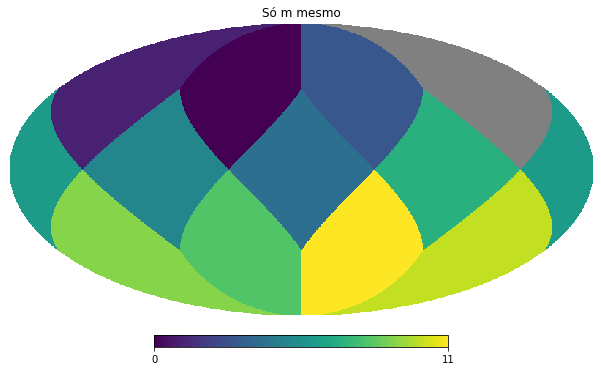

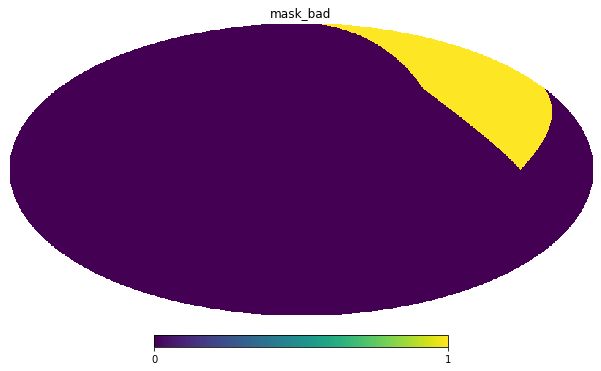

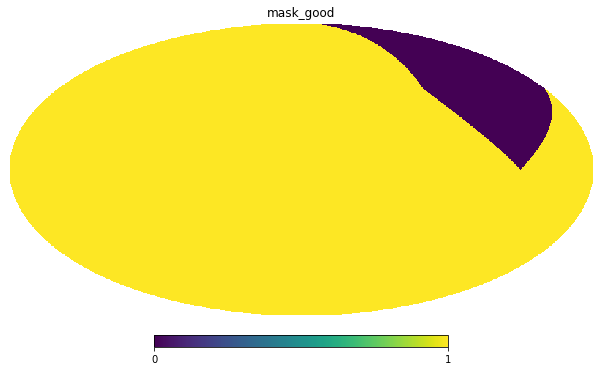

In [ ]:
import healpy as hp
import numpy as np
m = np.arange(12.)
m[2] = hp.UNSEEN
m_bad = hp.mask_bad(m)
m_good = hp.mask_good(m)

print('m_bad  ->', m_bad )
print('m_good ->', m_good)

hp.mollview(m, title      = 'Só m mesmo')
hp.mollview(m_bad, title  = 'mask_bad'  )
hp.mollview(m_good, title = 'mask_good' )

In [ ]:
hp.npix2nside(len(mapa)-1)

ValueError: Wrong pixel number (it is not 12*nside**2)

FileNotFoundError: [Errno 2] No such file or directory: '/path/0Mhz.png'

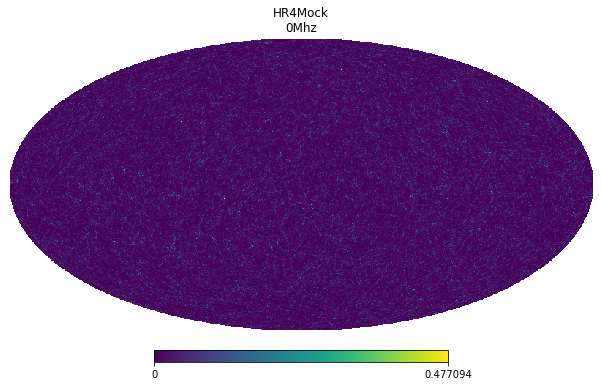

In [ ]:
import matplotlib.pyplot as plt
mapa = []
for i in  range(0,29):
    mapa.append(np.load('/home/barauna/Documentos/Project/galaxy_number_real/'+str(i)+'Mhz.npy'))
    hp.mollview(mapa[i] ,title = 'HR4Mock\n'+str(i)+'Mhz')
    plt.savefig('/path/'+str(i)+'Mhz.png', dpi=100, bbox_inches='tight')


In [ ]:
cmb

NameError: name 'cmb' is not defined